# **Рынок заведений общественного питания Москвы**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
В доступе датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках.Она носит исключительно справочный характер.

**Задачи:**

1. Подготовить исследование рынка Москвы.
2. Детализировать исследование в отношении открытия кофейни.
3. Презентовать полученные результаты.


# **Загрузка данные и изучение общей информации**

In [1]:
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
sns.set_palette('muted')
import json
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [2]:
try:
  data, state_geo = (
      pd.read_csv('moscow_places.csv'),
      'admin_level_geomap.geojson'
)
except:
  data, state_geo = (
      pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv'),
      'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
)

In [3]:
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Из данных видно, что всем столбцам присвоены корректные типы. Все заголовки представлены в нижнем регистре и хорошем стиле. В некоторых столбца в данных присутствуют пропуски.

Посмотрим данные о скольки заведениях представлены в датасете.

In [5]:
print ('Количество заведений:', data['name'].nunique())

Количество заведений: 5614


# **Предобработка данных**

Проверим данные на явные дубликаты

In [6]:
print('Количество дубликатов:', data.duplicated().sum())

Количество дубликатов: 0


Посмотрим на не явные дубликаты по значеним lat и	lng

In [7]:
data[data.duplicated(['lat', 'lng'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
182,Карелия,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,NaN
273,Pho Oanh,кафе,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 11:00–21:30",55.875804,37.665551,4.0,NaN,NaN,NaN,NaN,1,100.0
662,Family Cafe Mayak,ресторан,"Москва, Головинское шоссе, 10Б",Северный административный округ,"ежедневно, 10:00–22:00",55.837181,37.497324,4.7,NaN,NaN,NaN,NaN,0,NaN
1074,Халяль Кафе-Пекарня,булочная,"Москва, Анадырский проезд, 8, корп. 1",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.863555,37.682835,3.7,NaN,Средний счёт:300–700 ₽,500.0,NaN,0,100.0
1452,Сикварули,ресторан,"Москва, улица Куусинена, 11, корп. 2",Северный административный округ,"ежедневно, 10:00–22:00",55.782729,37.513952,4.4,NaN,NaN,NaN,NaN,1,10.0
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2007,Лепим и Варим,кафе,"Москва, Лесная улица, 20, стр. 3",Центральный административный округ,"ежедневно, 10:00–23:00",55.780218,37.593084,4.4,средние,Средний счёт:400–800 ₽,600.0,NaN,1,500.0
2841,Чайхана Döner,кафе,"Москва, Измайловский проспект, 61с2",Восточный административный округ,"ежедневно, круглосуточно",55.788610,37.783970,4.0,NaN,NaN,NaN,NaN,0,NaN
2866,Dragon Mixology Bar,кафе,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.810949,37.799413,3.8,NaN,NaN,NaN,NaN,0,NaN
2974,Позы&Буузы,кафе,"Москва, Хабаровская улица, 15",Восточный административный округ,"пн-чт 11:00–22:00; пт 11:00–23:00; сб,вс 11:00...",55.822498,37.823358,4.3,NaN,NaN,NaN,NaN,0,75.0


Выбранных строк достаточно много, посмотрим подробнее первую.

In [8]:
data.loc[((data['lat'] == 55.891936) &(data['lng' ] == 37.536068))]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
121,Встреча,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, круглосуточно",55.891936,37.536068,4.1,NaN,NaN,NaN,NaN,1,NaN
182,Карелия,кафе,"Москва, Карельский бульвар, 4А",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,NaN


Идея оказалась не верной, видно, что эти стоки не являются дубликатами, просто веротнее всего заведения находятся в одном здании.

Добавим в проверку столбец name, но для начала приведем все названия в нём к нижнему регистру.

In [9]:
data['name'] = data['name'].str.lower()

In [10]:
data[data.duplicated(['name','lat', 'lng'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


При такой проверке нашелся один задублировавшийся ресторан, рассмотрим его подробнее.

In [11]:
data.loc[((data['lat'] == 55.806307) &(data['lng' ] == 37.497566))]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Действительно видно, что данные по ресторану more poke оказались дубликатами. Только не понятно какая из строк корректна. Различия видны по столбцу hours и chain. Посмотрим является ли этот ресторан сетевым и если да, то удалим строку со значением 0 в столбце hours.

In [12]:
data.loc[data['name'] == 'more poke']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


Да, у сети есть ещё один ресторан в Москве.
Удалим строку со значением 0 в столбце hours.

In [13]:
data.drop(labels = [1430], axis = 0, inplace = True)
data.reset_index(drop= True , inplace= True)

#print(data.loc[((data['lat'] == 55.806307) &(data['lng' ] == 37.497566))])
#data.info()

Проверим данные на пропуски.

In [14]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5090
avg_bill             4589
middle_avg_bill      5256
middle_coffee_cup    7870
chain                   0
seats                3611
dtype: int64

В данным присутствуют пропуски, в каких-то столбцах пропущено более 40% данных.
При этом даных для их заполнения нет, поэтому решено оставить всё в исходном виде. Загрушки так же решено на данном этапе не ставить.

У столбцов middle_avg_bill и middle_coffee_cup по ТЗ специфические способы заполнения, проверим нет ли в данных аномальных значений в данных столбцах, когда при не заполненных данных в столбце avg_bill присутсвтуют данные в столбцах middle_avg_bill  и middle_coffee_cup.

In [15]:
data[data['middle_avg_bill'].notnull() & data['avg_bill'].isnull()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [16]:
data[data['middle_coffee_cup'].notnull() & data['avg_bill'].isnull()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Отлично, технология заполнения столбцов middle_avg_bill и middle_coffee_cup не дала сбоя и аномалий в них не обнаружено.

Дальше пройдёмся по значениям в остальных столбцах.

Столбец category.

In [17]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Столбец rating.

In [18]:
pd.Series(data['rating'].unique()).sort_values()

32    1.0
33    1.1
36    1.2
35    1.3
20    1.4
18    1.5
40    1.6
31    1.7
38    1.8
39    1.9
19    2.0
37    2.1
28    2.2
27    2.3
34    2.4
29    2.5
30    2.6
16    2.7
15    2.8
24    2.9
25    3.0
17    3.1
23    3.2
21    3.3
26    3.4
22    3.5
14    3.6
13    3.7
11    3.8
12    3.9
10    4.0
9     4.1
8     4.2
6     4.3
3     4.4
1     4.5
2     4.6
4     4.7
5     4.8
7     4.9
0     5.0
dtype: float64

Столбец rating соответствует ТЗ, аномальные значения отсутствуют, низший рейтинг заведения 1.0, высший 5.0.

Столбец price.

In [19]:
 data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Столбец middle_coffee_cup.

In [20]:
pd.Series(data['middle_coffee_cup'].unique()).sort_values().head(5)

16    60.0
18    75.0
71    79.0
51    80.0
49    84.0
dtype: float64

In [21]:
pd.Series(data['middle_coffee_cup'].unique()).sort_values().tail(5)

55     325.0
77     328.0
88     375.0
70    1568.0
0        NaN
dtype: float64

В данных столбца middle_coffee_cup выявлена цена одной чашки капучино в размере 1568 р, это многовато для такого продукта, посмотрим к какому ресторану относится это значение.

In [22]:
data.loc[(data['middle_coffee_cup'] == 1568.0)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2858,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


Есть большие сомнения, что в сети кофейн со средней ценовой категорией, как Шоколадница, цена чайшки капучино будет составлять 2907р, вероятнее всего допущена ошибка и разброс цен на самом деле составляет 230-290 р. Поправим данные по данному заведению в столбце avg_bill и middle_coffee_cup.

In [23]:
data.loc[2858,'avg_bill'] = 'Цена чашки капучино:230–290 ₽'
data.loc[2858,'middle_coffee_cup'] = 260.0

In [24]:
#data.iloc [[2858]]

Столбец middle_avg_bill.

In [25]:
pd.Series(data['middle_avg_bill'].unique()).sort_values().head(5)

175     0.0
220    30.0
132    50.0
144    67.0
204    90.0
dtype: float64

In [26]:
pd.Series(data['middle_avg_bill'].unique()).sort_values().tail(5)

177     7250.0
192    10000.0
79     11000.0
217    35000.0
0          NaN
dtype: float64

А в столбце с оценкой среднего чека middle_avg_bill выявлены заведения со средним чеком в 0 рублей.

In [27]:
data.loc[(data['middle_avg_bill'] == 0.0)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3687,кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0


Видна ошибка в представлении данных по данному заведению. Но на данном этапе принято решение не удалять его, возможно не заполненные данные не будут нужны при анализе.

Столбец chain.

In [28]:
 data['chain'].value_counts()

0    5200
1    3205
Name: chain, dtype: int64

Столбец seats.

In [29]:
pd.Series(data['seats'].unique()).sort_values().head(5)

27     0.0
73     1.0
40     2.0
117    3.0
1      4.0
dtype: float64

In [30]:
pd.Series(data['seats'].unique()).sort_values().tail(10)

214     644.0
202     650.0
153     660.0
226     675.0
201     760.0
178     920.0
152    1040.0
179    1200.0
212    1288.0
0         NaN
dtype: float64

Выявлены заведения с посадочными местами равными 0, отобразим их.

In [31]:
data.loc[(data['seats'] == 0.0)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
84,meat doner kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0
177,арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0
196,донер-шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0
203,тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,1,0.0
211,неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8117,бико,булочная,"Москва, улица Симоновский Вал, 13, стр. 3",Юго-Восточный административный округ,"ежедневно, 08:00–20:00",55.723340,37.664252,1.3,NaN,NaN,NaN,NaN,0,0.0
8167,чайхана уч кудук,кофейня,"Москва, улица Симоновский Вал, 26, корп. 1",Южный административный округ,"ежедневно, 09:00–00:00",55.718663,37.662887,4.3,NaN,NaN,NaN,NaN,0,0.0
8171,масса кофе,кофейня,"Москва, Холодильный переулок, 2",Южный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.709713,37.624388,4.3,средние,Цена чашки капучино:100–210 ₽,NaN,155.0,0,0.0
8335,сочная шаурма в кузьминках,быстрое питание,"Москва, Волгоградский проспект, 102",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.703834,37.773831,3.9,NaN,Средний счёт:120–130 ₽,125.0,NaN,0,0.0


Таких заведений оказалось 136, но по категориям(булочная, быстрое питание, кофейня и т.д) и названиям (донер, шаурма, кофе) видно что это заведения вероятнее всего действительно не имеют посадочных мест и работаю на вынос. Поэтому, решено оставить данные по ним в файле без изменений.

Так же в данных присутствуют заведения, на первый взгляд с очень большим количеством посадочных мест (больше 1000). Но быстрый поиск в интернете выдаёт, что заведения с таким количеством посадочных мест действительно присутствуют в Москве и их количество больше 20ти.

Создадим столбец street с названиями улиц из столбца с адресом.

In [32]:
street = data['address'].str.split(",", n = 2, expand = True)
#street

data['street']= street[1]
data.head(5)


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)


In [33]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
#data.head(20)

### Выводы по разделу Предобработка данных

1. Данные проверены на наличие дубликатов, выявленные дубликаты удалины из датафрейма.
2. В файле присутствуют пропуски, в каких-то столбцах пропущено более 40% данных. При этом даных для их заполнения нет, поэтому решено оставить всё в исходном виде. Загрушки так же решено на данном этапе не ставить.
3. Так же данные проверены на аномалии. Выявленные аномальные значения скорректированы.
4. Создан столбец street с названиями улиц из столбца с адресом.
5. Создан столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно.

Работа по предобработке данных завершена, данные подготовлены к дальнейшему анализу.



# **Анализ данных**

## *Категории заведений представленые в данных.*

In [34]:
category = data.groupby('category')[['name']].agg('count').sort_values(by = 'name', ascending = False).reset_index()
category.columns = ['category', 'total_count']
category


,category,total_count
0,кафе,2378
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [35]:
fig = px.bar(category.sort_values(by='total_count', ascending=False),
             x='category',
             y='total_count',
             text='total_count',
             color='category'
             )
fig.update_layout(title = 'Распределение количества заведений по категориям',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений',
                  title_x=0.5,
                  height=600,
                  width=1000,
                  showlegend = False)
fig.show()

В данных представлены следующие категории: кафе, ресторан, кофейня, пиццерия, бар,паб, быстрое питание, булочная, столовая.

Больше всего объектов общественного питания наблюдается в категориях кафе и рестораны. Наименьшее количество в столовых и булочных.

## *Количество посадочных мест по категориям*

In [36]:
category = data.groupby('category')[['seats']].agg('median').sort_values(by = 'seats', ascending = False).reset_index()
category.columns = ['category', 'seats_median']
category

,category,seats_median
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


In [37]:
# строим столбчатую диаграмму
fig = px.bar(category.sort_values(by='seats_median', ascending=True), # загружаем данные и заново их сортируем
             x='seats_median', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='seats_median' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объектов общественного питания в категории
            )
# оформляем график
fig.update_layout(title='Распределение количества посадочных мест по категориям',
                  title_x=0.5,
                   xaxis_title='Медианное количество посадочных мест',
                   yaxis_title='Категория заведения',
                   width=1000, # указываем размеры графика
                   height=600)

fig.show() # выводим график

Из данных видно что медианное значение количества посадочных мест незначительно различается в категориях рестораны, бар,паб, кофейня, но при этов всё же наибольшее значение имеют рестораны - 86.

На последнем месте по количеству мест расположились булочные - 55 мест.

## *Соотношение сетевых и несетевых заведений*

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [38]:
chain = data['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5200
1,1,3205


In [39]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], # указываем значения, которые появятся на метках сегментов
                             values=chain['count'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Соотношение сетевых и несетевых заведений', # указываем заголовок графика
                  title_x=0.5,
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.19, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Количество заведений',
                                    showarrow=False)])
fig.show() # выводим график

Из данных можно увидеть, что в Москве преобладают несетевые заведения общественного питания (61.9%). Но при этом у сетевых заведений всё же тоже присутствует достаточный объем, почти 40%.


## *Какие категории заведений чаще являются сетевыми*

Оценим количественное соотношение сетевых и несетевых заведений в каждой категории. Для этого подготовим данные.

In [40]:
chain_not_chain = data.groupby(['category', 'chain']) \
                          .agg(count=('category', 'count')) \
                          .reset_index()
chain_not_chain

,category,chain,count
0,"бар,паб",0,596
1,"бар,паб",1,169
2,булочная,0,99
3,булочная,1,157
4,быстрое питание,0,371
5,быстрое питание,1,232
6,кафе,0,1599
7,кафе,1,779
8,кофейня,0,693
9,кофейня,1,720


Визуализируем получившееся распределение.

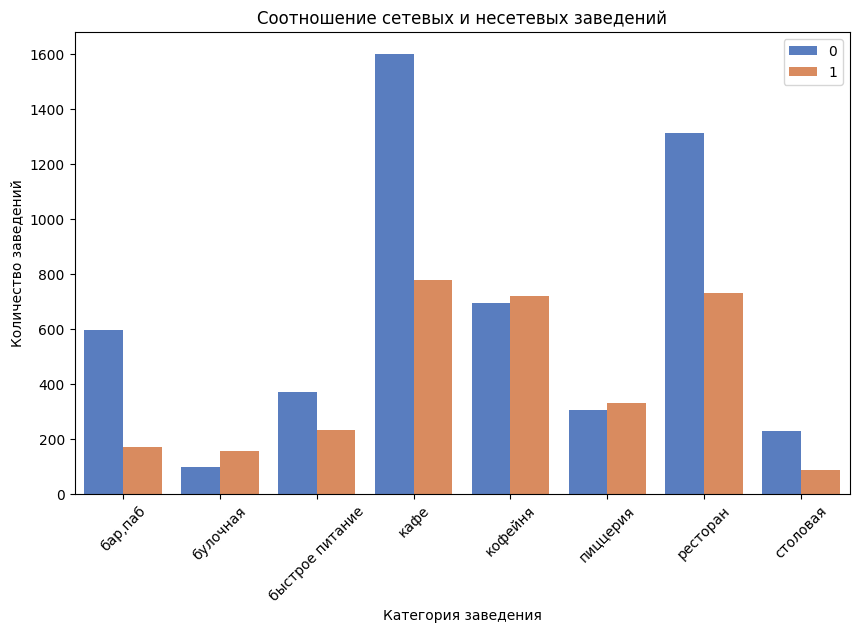

In [41]:
plt.figure(figsize=(10, 6))

sns.barplot(x='category',
            y='count',
            data=chain_not_chain,
            hue='chain')

plt.title('Соотношение сетевых и несетевых заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.legend(loc='upper right', fontsize=10)

plt.show()

Из рассматриваемых категорий сетевые заведения занимают большую долю в булочных, кофейнях и пиццериях. Но их перевес не слишком значителен.

## *Топ-15 популярных сетей в Москве.*


In [42]:
chain_top_15 = data.query('chain == 1').groupby(['name', 'category']).agg(count=('name', 'count')).sort_values(by = 'count', ascending = False).reset_index().head(15)
chain_top_15

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


In [43]:
fig = px.bar(chain_top_15,
             x='count',
             y='name',
             text='count',
             color='name'
             )
fig.update_layout(title = 'Топ-15 популярных сетей Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений',
                  title_x=0.5,
                  height=600,
                  width=1000,
                  showlegend = False)
fig.show()

В топ 15 вошли заведения под всеми известными брендами. На первом месте по популлярности оказалась Шоколадница, а замыкает ТОП 15 Кофемания.
Какого-то признака, объединяющего данные заведения нет, все заведения относятся к разным категориям (кофейня, ресторан, кафе, пиццерия, булочная).

## *Общее количество заведений и количество заведений каждой категории по административным районам Москвы.*

In [44]:
#посчитаем количество заведений каждой категории по районам
district_category = data.groupby(['district', 'category']).agg(count=('name', 'count')).sort_values(by = 'count', ascending = False).reset_index()
district_category

,district,category,count
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


In [45]:
#посчитаем общее количество заведений по районам
district_total=data.groupby(['district']).agg(count=('name', 'count')).sort_values(by = 'count', ascending = False).reset_index()


In [46]:
#объединим две получившиеся таблицы
district = district_category.merge(district_total, on='district')
district.columns = ['district', 'category', 'count', 'count_total']
district


,district,category,count,count_total
0,Центральный административный округ,ресторан,670,2242
1,Центральный административный округ,кафе,464,2242
2,Центральный административный округ,кофейня,428,2242
3,Центральный административный округ,"бар,паб",364,2242
4,Центральный административный округ,пиццерия,113,2242
...,...,...,...,...
67,Северо-Западный административный округ,пиццерия,40,409
68,Северо-Западный административный округ,быстрое питание,30,409
69,Северо-Западный административный округ,"бар,паб",23,409
70,Северо-Западный административный округ,столовая,18,409


In [47]:
fig = px.bar(district.sort_values(by='count_total', ascending=False), # загружаем данные и заново их сортируем
             x='district', # указываем столбец с данными для оси X
             y='count',# указываем столбец с данными для оси Y
             color = 'category',
             hover_data=['count', 'count_total'],
             text='count'
            )
# оформляем график
fig.update_layout(title='Распределение количества заведений по районам',
                  title_x=0.5,
                   xaxis_title='Район Москвы',
                   yaxis_title='Количество заведений',
                   width=1100, # указываем размеры графика
                   height=900,
                   )
fig.show() # выводим график

Из данных видно что больше всего заведений общественного питания расположено в Центральном административном округе, их значение более чем 2 раза привышает количество заведений в любом другом округе Москвы. При этом в остальных округах нет сильного перекоса по количеству заведений, а в Северном, Южном и Северо-Восточном округах количество вообще практически равное.
Сильное отствавание от остальных наблюдается лишь в Северо-Западном административном округе.

При этом если рассматривать округа в разбивке по категориям заведений, то в ЦАО преобладают рестораны, на втором месте находятся кафе, а вот в остальных округах данные категории поменялись местами и  в них преобладают кафе, а рестораны находятся на втором месте по количеству.

## *Распределение средних рейтингов по категориям заведений.*


 Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [48]:
rating=data.groupby(['category']).agg(mean_rating=('rating', 'mean')).sort_values(by = 'mean_rating', ascending = False).reset_index()
rating['mean_rating'] = rating['mean_rating'].round(2)
rating

,category,mean_rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [49]:
# строим столбчатую диаграмму
fig = px.bar(rating.sort_values(by='mean_rating', ascending=False), # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='mean_rating', # указываем столбец с данными для оси Y
             text='mean_rating' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве сетевых объектов общественного питания в категории
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений.',
                  title_x=0.5,
                   xaxis_title='Категория заведения',
                   yaxis_title='Средний рейтинг',
                   width=900, # указываем размеры графика
                   height=500)

fig.show() # выводим график

Как видно из диграммы, средний рейтинг не сильно различается в разных категориях общепита. Он расположился между 4.05 (быстрое питание) и 4.39 (бар, паб).

## *Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.*

In [50]:
rating_district=data.groupby('district')['rating'].agg('mean').reset_index()
rating_district = rating_district.sort_values(by = 'rating', ascending = False).reset_index(drop=True)
rating_district['rating'] = rating_district['rating'].round(2)
rating_district

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [51]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Рейтинги заведений по районам расположились между 4.1 и 4.38. ЦАО район с самым высоким средним рейтингом, а ЮВАО с самым низким.

## *Отобразим все заведения датасета на карте с помощью кластеров.*

In [52]:

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

## *Топ-15 улиц по количеству заведений.*

Найдём топ-15 улиц по количеству заведений.

In [53]:
top_15_street = data.groupby('street').agg(count=('name', 'count')).sort_values(by = 'count', ascending = False).reset_index().head(15)
list_top_15 = top_15_street['street'].to_list()
list_top_15

[' проспект Мира',
 ' Профсоюзная улица',
 ' проспект Вернадского',
 ' Ленинский проспект',
 ' Ленинградский проспект',
 ' Дмитровское шоссе',
 ' Каширское шоссе',
 ' Варшавское шоссе',
 ' Ленинградское шоссе',
 ' МКАД',
 ' Люблинская улица',
 ' улица Вавилова',
 ' Кутузовский проспект',
 ' улица Миклухо-Маклая',
 ' Пятницкая улица']

Выведем данные с распределением количества заведений и их категорий по этим улицам и визуализируем эти данные.

In [54]:
top_15_street_category = data.query('street in @list_top_15').groupby(['street', 'category']).agg(count=('name', 'count')).reset_index()
top_15_street_category

,street,category,count
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


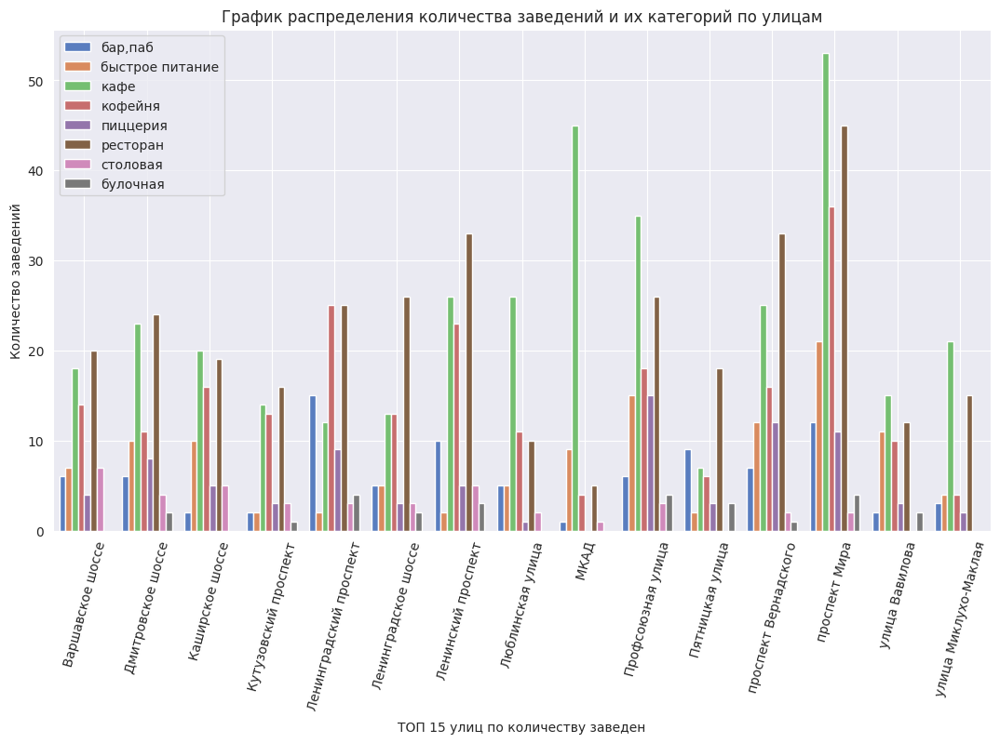

In [55]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(13, 7))
# строим столбчатый график средствами seaborn
sns.barplot(x='street', y='count', data=top_15_street_category, hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения количества заведений и их категорий по улицам')
plt.xlabel('ТОП 15 улиц по количеству заведен')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=75)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper left', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()


Среди выбранных улиц лидером по количеству заведений является проспект Мира.

Большу часть заведений на указаных улицах составляют кафе, за ними следуют рестораны и кофейни.

## *Найдите улицы, на которых находится только один объект общепита.*

Выделим улицы, на которых находится только один объект общепита в отдельный список.

In [56]:
street_one = (data.groupby('street').agg(count=('name', 'count'))).query('count == 1').reset_index()
list_st = street_one['street'].to_list()
print('Количество улиц с одним заведением общепита:', street_one['count'].sum())

Количество улиц с одним заведением общепита: 458


Теперь посмотрим как распределены заведения по категориям на данных улицах.

In [57]:
street_one_catecory = data.query('street in @list_st').groupby('category').agg(count=('name', 'count')).sort_values(by = 'count', ascending = False).reset_index()
street_one_catecory

,category,count
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


Как оказалось, единственные заведения на улицах в основном имеют категорию кафе(160 шт), реже всего категорию булочная (8 шт)

Так же  можно посмотреть распределение по районам.

In [58]:
street_one_catecory = data.query('street in @list_st').groupby('district').agg(count=('name', 'count')).sort_values(by = 'count', ascending = False).reset_index()
street_one_catecory

,district,count
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,52
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


Наибольшее количество единственных заведений на улице разместилось в ЦАО.

## *Цена среднего чека в зависимости от района Москвы.*

Посчитаем медиану значений средних чеков заведений (столбец middle_avg_bill) для каждого района. Используя это значение в качестве ценового индикатора района построим фоновую картограмму (хороплет) для каждого района.

In [59]:
middle_avg_bill_district = data.groupby('district').agg(median=('middle_avg_bill', 'median')).reset_index()
middle_avg_bill_district

,district,median
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [60]:
# создаём карту Москвы
s = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_district,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Медианный средний чек по районам',
).add_to(s)

# выводим карту
s

Ожидаемо медианное значение средних чеков заведений оказалось выше в ЦАО, при этом такой же высокий чек показал и ЗАО.
В остальных района, расположенных на удалении от центра цена среднего чека снижается, самый низкий средний чек выявлен в ЮВАО.

## Вывод по разделу Анализ данных

- Больше всего объектов общественного питания в Москве наблюдается в категориях кафе (28,3%) и рестораны (24,3%). Наименьшее количество в столовых (3.75%) и булочных (3.05%).

- Медианное значение количества посадочных мест не значительно различается в категорях рестораны, бар,паб, кофейня, но при этов всё же наибольшее значение имеют рестораны - 86.
На последнем месте по количеству мест расположились булочные - 55 мест.

- В Москве преобладают несетевые заведения общественного питания (61.9%). Но при этом у сетевых заведений всё же тоже присутствует достаточный объем, почти 40%.

- Сетевые заведения занимают большую долю в булочных, кофейнях и пиццериях. Но их перевес не слишком значителен.

- В топ 15 вошли заведения под всеми известными брендами. На первом месте по популлярности оказалась Шоколадница, а замыкает ТОП 15 Кофемания. Какого-то признака, объединяющего данные заведения нет, все заведения относятся к разным категориям (кофейня, ресторан, кафе, пиццерия, булочная).

- Больше всего заведений общественного питания расположено в Центральном административном округе, их значение более чем 2 раза привышает количество заведений в любом другом округе Москвы. При этом в остальных округах нет сильного перекоса по количеству заведений, а в Северном, Южном и Северо-Восточном округах количество вообще практически равное. Сильное отствавание от остальных наблюдается лишь в Северо-Западном административном округе.
При этом если рассматривать округа в разбивке по категориям заведений, то в ЦАО преобладают рестораны, на втором месте находятся кафе, а вот в остальных округах данные категории поменялись местами и в них преобладают кафе, а рестораны находятся на втором месте по количеству.

- Средний рейтинг не сильно различается в разных категориях общепита. Он расположился между 4.05 (быстрое питание) и 4.39 (бар, паб).

- Медианное значение средних чеков заведений оказалось выше в ЦАО, при этом такой же высокий чек показал и ЗАО. В остальных района, расположенных на удалении от центра цена среднего чека снижается, самый низкий средний чек выявлен в ЮВАО.

# **Детализация исследования: открытие кофейни**

Ответим на вопросы, сколько всего кофеен в датасете, в каких районах их больше всего и каковы особенности их расположения.

In [61]:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


## *Районы расположения кофеен*

Выделим из данных только те, которые относятся к категории кофейни и посмотрим в каких районах их больше всего.

In [62]:
coffee_house = data.query('category == "кофейня"').groupby('district').agg(count=('name', 'count')).sort_values(by = 'count', ascending = False).reset_index()

print('Общее количество кофеен:', coffee_house['count'].sum())
coffee_house

Общее количество кофеен: 1413


,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [63]:
# создаём карту Москвы
m_coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_house,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Колличество кофеен по районам',
).add_to(m_coffee)

# выводим карту
m_coffee

В датафрейме всего 1413 кофеен. Больше всего кофеен расположено в ЦАО (428), за ним с большим отрывом следует САО (193). Меньше всего кофеен обнаружено в СЗАО (62).

Нанесём кофейни на карту Москвы, что бы оценить принцип их расположения.

In [64]:
data_coffee_house=data.query('category == "кофейня"')

In [65]:

# создаём карту Москвы
p = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(p)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee_house.apply(create_clusters, axis=1)

# выводим карту
p

По выведенным кофейням можно видеть, что чаще всего они расположены по пути следования к метро, у самого метро, в районах прогулочных улиц, около либо в бизнес и торговых цетрах, а так же в больших современных жилых комплексах.

## *Круглосуточные кофейни*

In [66]:
coffee_house_24_7 = data_coffee_house[data_coffee_house['is_24/7'] == True]
coffee_house_24_7.groupby('district').agg(count=('name', 'count')).sort_values(by = 'count', ascending = False).reset_index()

,district,count
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [67]:
# создаём карту Москвы
coffee_24_7 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(coffee_24_7)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_house_24_7.apply(create_clusters, axis=1)

# выводим карту
coffee_24_7

Из данных видно, что круглосуточных кофеен совсем не много. В основном они сконцентрированны в ЦАО, что логично, т.к. в центре даже в ночное время достаточно большой трафик. Так же изучая маркеры на карте можно увидеть, что практически все ночные кофейни сетевые.

## *Распределение среднего рейтинга по районам.*


In [68]:
coffee_house_rating = data_coffee_house.groupby('district').agg(avg_rating=('rating', 'mean')).sort_values(by = 'avg_rating', ascending = False).reset_index().round(2)
coffee_house_rating

,district,avg_rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


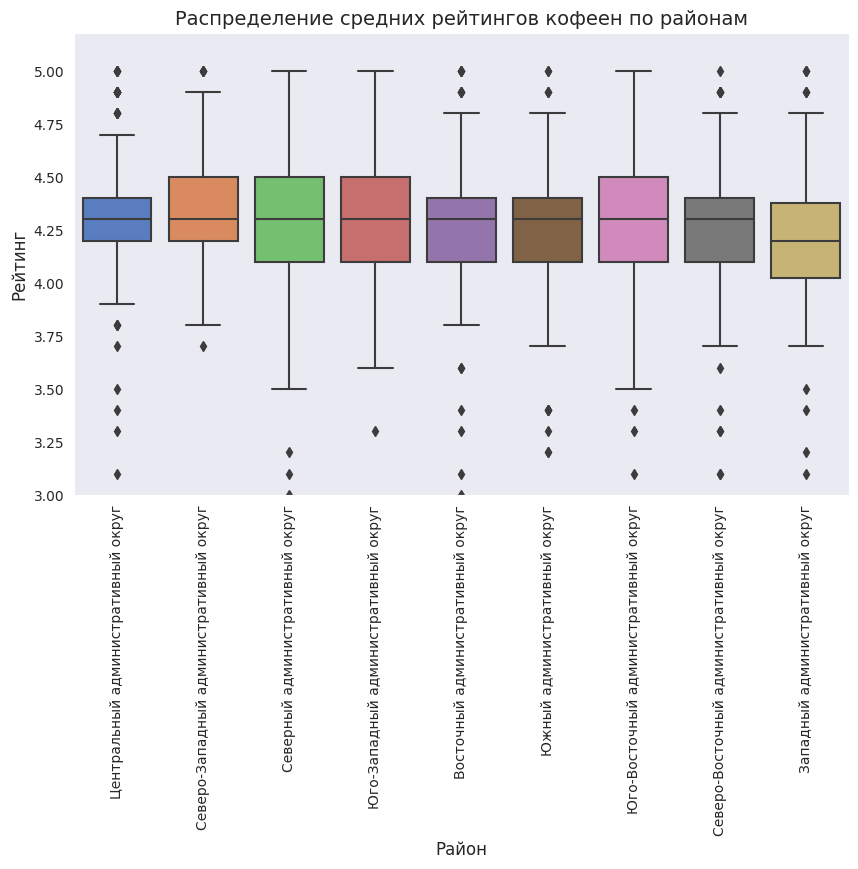

In [69]:
# назначаем размер графика
plt.figure(figsize=(10, 6))
# строим график boxplot средствами seaborn
sns.boxplot(x='district',
            y='rating',
            data=data_coffee_house,
            order=coffee_house_rating.district
            )

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средних рейтингов кофеен по районам', fontsize=14)
plt.xlabel('Район', fontsize=12)
plt.ylabel('Рейтинг', fontsize=12)
plt.ylim(3)
# поворачиваем подписи значений по оси X на 90 градусов
plt.xticks(rotation=90)
# отображаем график на экране
plt.show()

Средний рейтинг кофеен составляет от 4.2 (ЗАО) до 4.34 (ЦАО). При этом медианное значение практически по всем районам одинаково и составляет 4.3 И только у ЗАО 4.2.
Если судить по квартилям, то наиболший разброс в рейтингах (исключая аномальные значения) фиксируется в САО, ЮЗАО и ЮВАО, наименьший - в Юго-Западном округе.

## *Стоимость чашки капучино.*

Для начала рассчитаем среднюю цену чашки капучино для Москвы, без привязки к району.

In [70]:
print('Средняя цена чашки капучино в Москве:', data['middle_coffee_cup'].mean().round())

Средняя цена чашки капучино в Москве: 172.0


Рассчитаем среднюю цену на чашку капучино в зависимости от района Москвы и визуализируем данное распределение.

In [71]:
coffee_house_cup = data_coffee_house.groupby('district').agg(avg_rating=('middle_coffee_cup', 'mean')).sort_values(by = 'avg_rating', ascending = False).reset_index().round(2)
coffee_house_cup

,district,avg_rating
0,Западный административный округ,189.94
1,Центральный административный округ,187.52
2,Юго-Западный административный округ,184.18
3,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
5,Северо-Восточный административный округ,165.33
6,Южный административный округ,158.49
7,Юго-Восточный административный округ,151.09
8,Восточный административный округ,142.88


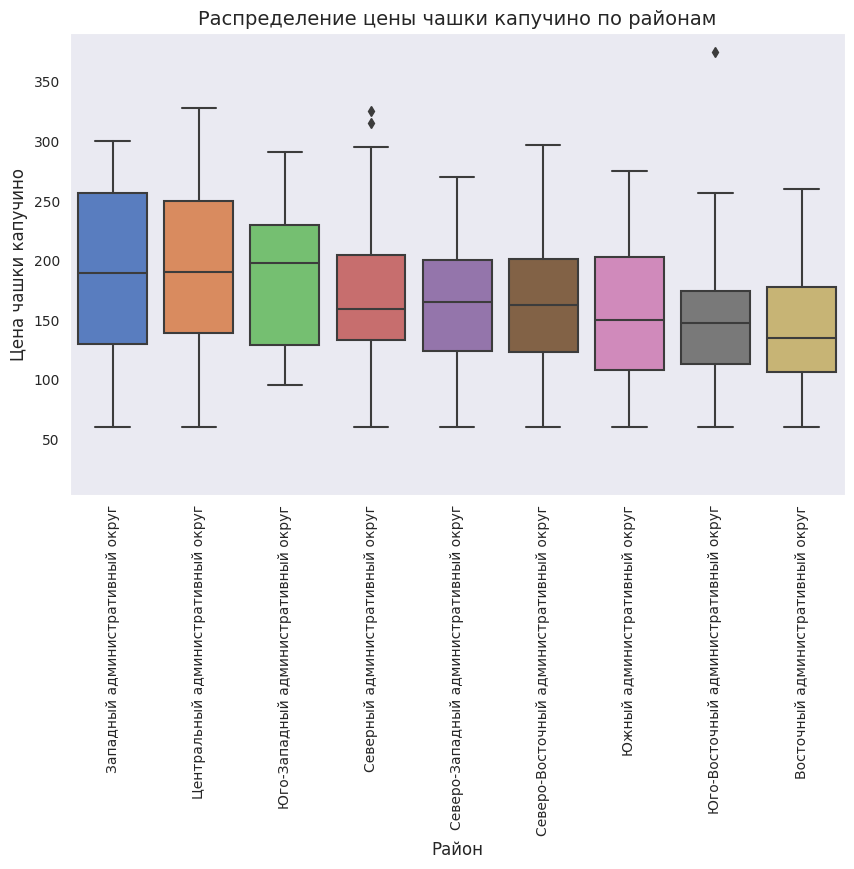

In [72]:
# назначаем размер графика
plt.figure(figsize=(10, 6))
# строим график boxplot средствами seaborn
sns.boxplot(x='district',
            y='middle_coffee_cup',
            data=data_coffee_house,
            order=coffee_house_cup.district
            )

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение цены чашки капучино по районам', fontsize=14)
plt.xlabel('Район', fontsize=12)
plt.ylabel('Цена чашки капучино', fontsize=12)
plt.ylim(3)
# поворачиваем подписи значений по оси X на 90 градусов
plt.xticks(rotation=90)
# отображаем график на экране
plt.show()

Cредняя цена чашки капучино для Москвы составляет 172р.
Самая высокая средняя цена на чашку капучино зафиксирована в ЗАО, ЦАО и ЮЗАО (184-190 р.), самая низкая цена в ВАО (143р).
При этом судя по квартилям например в ЮЗАО выше распределение кофеен с ценой меньше медианного значения в 200р, а в САО наоборот. В остальных районах нет сильного смещения медианного значения.

## Вывод по разделу Детализация исследования: открытие кофейни

В Москве открыто достаточо большое количество кофеен (1413), но если всё же есть желание поробовать себя в данном бизнесе, то следует учесть следующие факторы по уже расположенным заведениям:
1. Больше всего кофеен расположено в ЦАО (428), за ним с большим отрывом следует САО (193). Меньше всего кафеен обнаружено в СЗАО (62).

2. Чаще всего кофейни расположены по пути следования к метро, у самого метро, в районах прогулочных улиц, около либо в бизнес и торговых цетрах, а так же в больших современных жилых комплексах.

3. Круглосуточных кофеен совсем не много. В основном они сконцентрированны в ЦАО и практическ все сетевые.

4. Средний рейтинг кофеен составляет от 4.2 (ЗАО) до 4.34 (ЦАО). При этом медианное значение практически по всем районам одинаково и составляет 4.3 И только у ЗАО 4.2. Если судить по квартилям, то наиболший разброс в рейтингах (исключая аномальные значения) фиксируется в САО, ЮЗАО и ЮВАО, наименьший - в Юго-Западном округе.

5. Cредняя цена чашки капучино для Москвы составляет 172р. Самая высокая средняя цена на чашку капучино зафиксирована в ЗАО, ЦАО и ЮЗАО (184-190 р.), самая низкая цена в ВАО (143р). При этом судя по квартилям например в ЮЗАО выше распределение кофеен с ценой меньше медианного значения в 200р, а в САО наоборот. В остальных районах нет сильного смещения медианного значения.

Таким образом, если это будет одна кофейня, то  лучше делать её не с круглосуточным режимом работы. Для открытия лучше рассмотреть районы ЗАО и ЮЗАО, в них и цена средней чашки капучино достаточно высока, что поможет быстрее окупить открытие, и при этом достаточное количество кофеен с рейтингом ниже медианного, у которых можно переманить клиентов хорошим продуктом.
Если смотреть по количеству уже открытых кофеен, то открытие в ЮЗАО выгоднее чем ЗАО.
Благоприятными местами будут новые большие ЖК расположенные не далеко от метро, а так же улицы с постоянным трафиком по пути следования к метро.

От открытия кофейни в  ЦАО, по моему мнению, пока стоит отказаться, там сконцентрировано самое большое количество кофеен, у всех достаточно высокий рейтинг и если заранее не уверен в качестве своего продукта, то выход на рынок и борьба за клиента в таком месте будет достаточно проблематичной.

Ссылка на презентацию

https://docs.google.com/presentation/d/1Am6Lbd46MMk_ItjW8GR4yof_Y9SyrAchm1Tp8pjONWs/edit?usp=sharing
